# Binary Classification with a Bank Churn Dataset

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV


# data preview

In [2]:
data = pd.read_csv('train_bank.csv')
data.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [3]:
data.shape

(165034, 14)

# taking sample

In [3]:
remove = data.sample(n=80000,random_state=42)
data_cleaned = data.drop(remove.index)

In [4]:
data_cleaned.shape

(85034, 14)

In [5]:
train = data_cleaned.copy()
train.set_index('id', inplace=True)

In [7]:
train.isna().sum()

CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

# Distribution of data

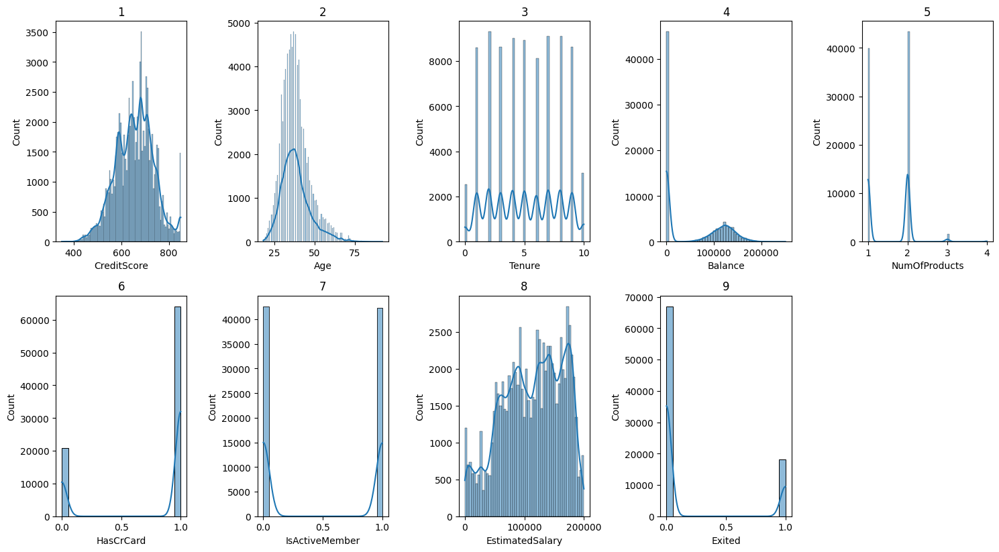

In [8]:
num_col = train.select_dtypes('number').drop(columns='CustomerId')
cat_col = train.select_dtypes('object').drop(columns='Surname')

plt.figure(figsize=(15,12))
for i,j in enumerate(num_col.columns,1):
    plt.subplot(3,5,i)
    sns.histplot(train[j],kde=True)
    plt.title(i)
plt.tight_layout()

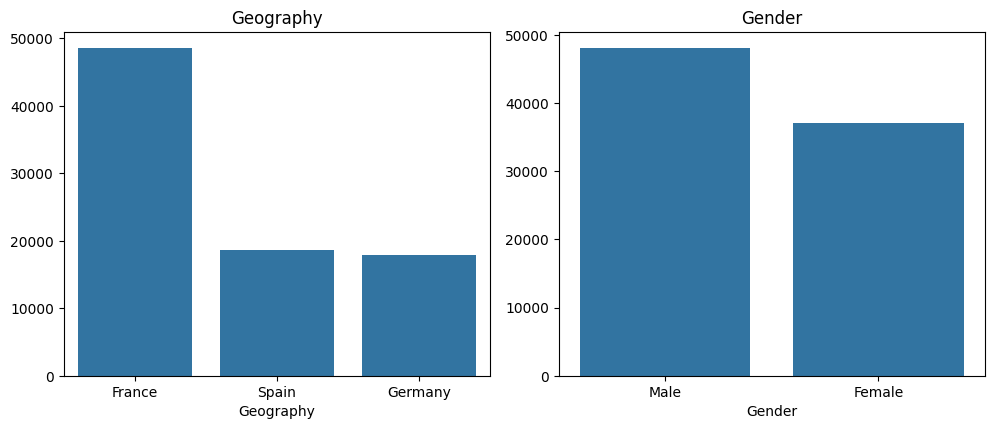

In [9]:
plt.figure(figsize=(15,12))

for i,j in enumerate(cat_col.columns,1):
    plt.subplot(3,3,i)
    sns.barplot(x=train[j].value_counts().index,y=train[j].value_counts().values)
    plt.title(j)
plt.tight_layout()

# EDA

<Axes: xlabel='Exited'>

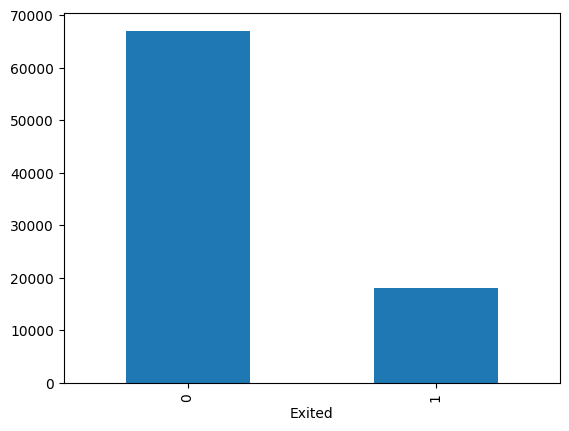

In [10]:
train['Exited'].value_counts().plot(kind='bar')

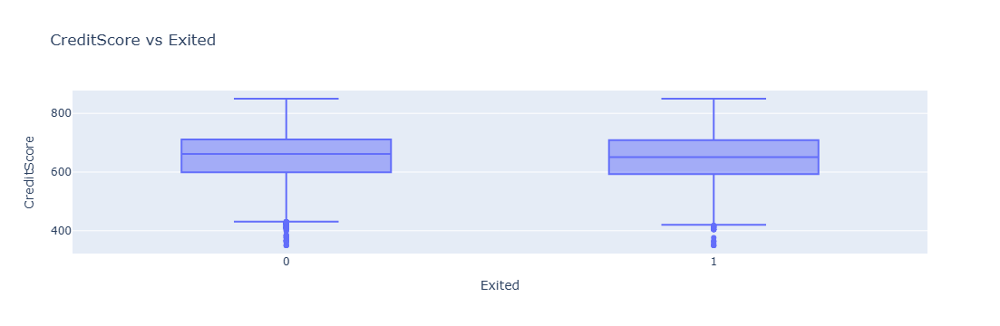

In [11]:
# relationship between CreditScore and the Exited 
fig = px.box(train, x='Exited', y='CreditScore', title='CreditScore vs Exited')
fig.show()

- from boxplot it is visible that credit score is same for both classes...but to confirm lets perform t test

In [12]:
from scipy.stats import ttest_ind
# null-- same average credit score
# alternate -- there is difference
# ttest_ind is appropriate when we are comparing two independent groups means.
excited = train[train['Exited']==1]['CreditScore']
non_excited = train[train['Exited']==0]['CreditScore']

t,p = ttest_ind(excited, non_excited)
print(f"T-statistic: {t}")
print(f"P-value: {p}")

T-statistic: -8.206232804264449
P-value: 2.313894935547721e-16


- reject null hypothesis..we can say that there is difference between credit score

# balance vs geogrphy vs excited

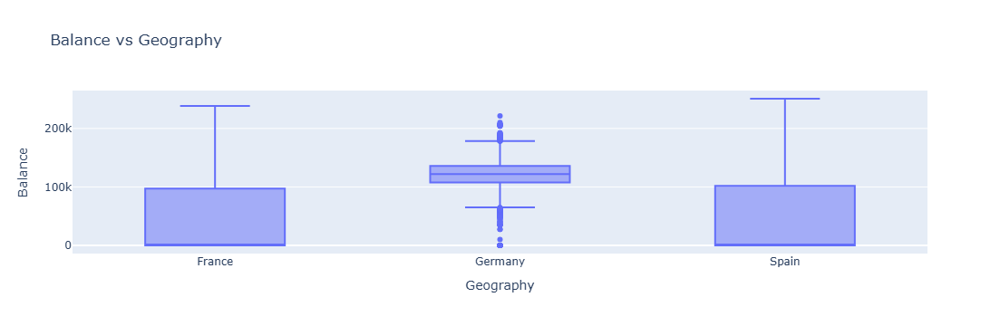

In [13]:
fig = px.box(train,x='Geography',y='Balance',title='Balance vs Geography')
fig.show()

- germany customers have high balance comapred to spain and france.
- but in germany there are outliers some customers have high balance
- france and spain is almost similer


In [14]:
# to confirm statistically we can perform anova test.
from scipy.stats import f_oneway

france = train[train['Geography']=='France']['Balance']
germany = train[train['Geography']=='Germany']['Balance']
spain= train[train['Geography'] == 'Spain']['Balance']
f, p = f_oneway(france, germany, spain)
print(f"F-statistic: {f}")
print(f"P-value: {p}")

F-statistic: 17382.708200587153
P-value: 0.0


- we can clearly say that one of the country has differnt mean

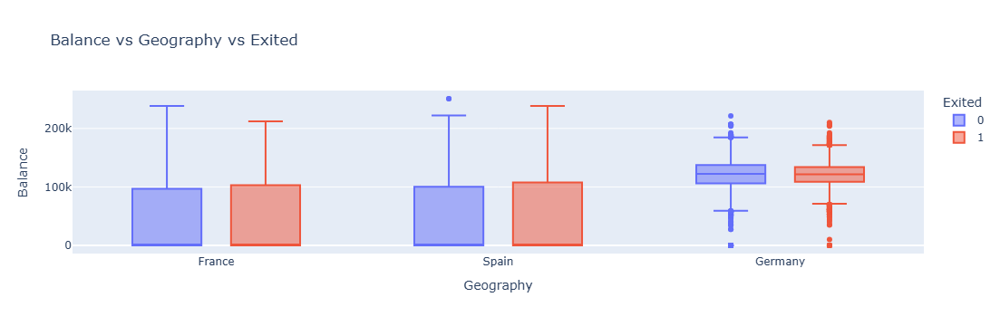

In [15]:
# lets check above both features with y variable
fig = px.box(train, x='Geography', y='Balance', color='Exited',title='Balance vs Geography vs Exited')
fig.show()

-  france and spain customers who have more money are likely to leave
- in germany customers who have less mooney likely to leave

Text(0.5, 1.0, 'Num of Products vs Exited Status')

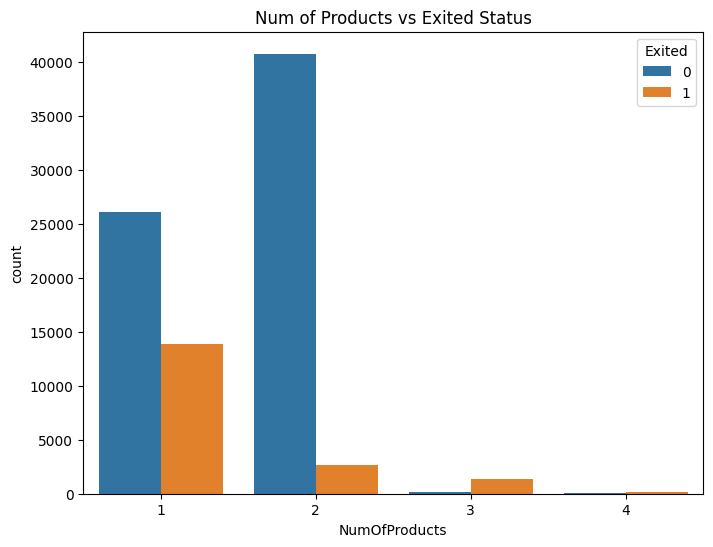

In [16]:
# numofprod vs excited
plt.figure(figsize=(8,6))
sns.countplot(x='NumOfProducts',hue='Exited',data=train)
plt.title('Num of Products vs Exited Status')



-  customers with 2 products, there is high chance that customer will stay.
-  customer with 3 or more product are more likely to not stay
- 1 product we cant say surely bcoz in both cases there is significant amount of customers are leaving and staying back

In [17]:
# confirm with chi2
# null ---  there is not asssociation
# alternate --  there is association
from scipy.stats import chi2_contingency
crosstab = pd.crosstab(train['NumOfProducts'],train['Exited'])
print(crosstab)
chi2, p, dof, expected = chi2_contingency(crosstab)

print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p}")

Exited             0      1
NumOfProducts              
1              26064  13871
2              40731   2623
3                183   1328
4                 30    204
Chi-square statistic: 14968.141767182395
P-value: 0.0


- reject the null hypothesis

In [18]:
# we can do binningn on credit score like low ,medium and high and can try to predict probability of 1,0

In [19]:
temp = train.copy()
bins = [300, 600, 750, 850]
labels = ['Low', 'Medium', 'High']

temp['creditscorecat'] = pd.cut(temp['CreditScore'],bins=bins, labels=labels)
prob = temp.groupby(['creditscorecat','Exited']).size().unstack()
total = prob.sum(axis=1).sum()
out = prob/total
out.loc['total'] = out.sum()
out

Exited,0,1
creditscorecat,,
Low,0.198485,0.059423
Medium,0.500376,0.129337
High,0.089153,0.023226
total,0.788014,0.211986


- there is 50 percent probability of customer staying given that customer is in medium category

In [20]:
# null -- no association
# null -- there is association
cross = pd.crosstab(temp['creditscorecat'],temp['Exited'])
chi2,p,dof,expected = chi2_contingency(cross)
print(p)

8.91179829841658e-14


-- there is association between those two columns

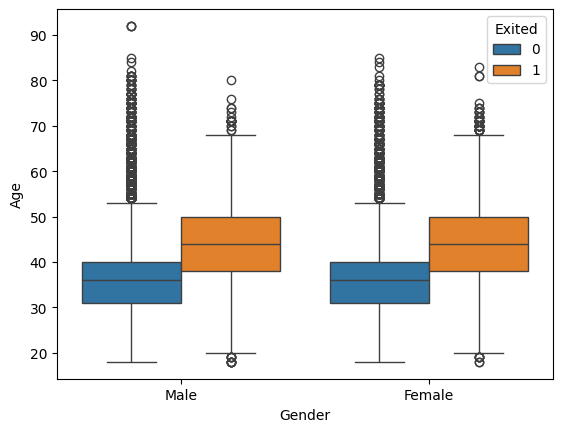

In [21]:
# gender vs age vs excited
sns.boxplot(x='Gender', y='Age',hue='Exited', data=temp)
plt.show()

- in both gender elder customers shows tendancy to leave. so it is visible age is important feature then gender

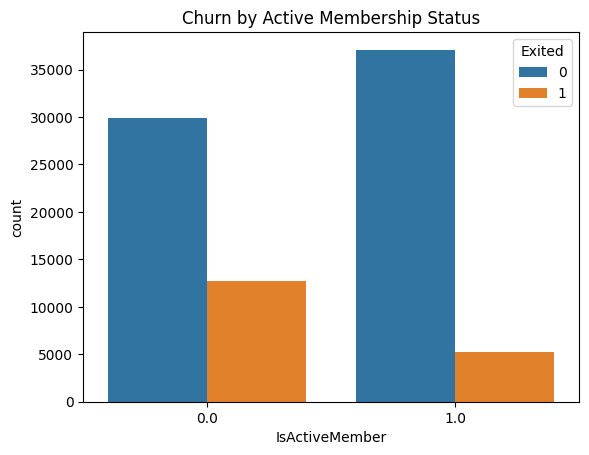

In [22]:
# is active vs excited
sns.countplot(x='IsActiveMember', hue='Exited', data=temp)
plt.title('Churn by Active Membership Status')
plt.show()

- active membership reduce the likelihood of churn. the majority of active members stay with the bank.

# EDA summary

- Age and balance are important, elder customers with high balance show liklihood of leaving
- number of prodcuts is also useuful column, it is showing if number of products is 2 then customers are staying
- geogrphy column shows churn vary depending on region,germany trends are very differtent from other two
- active membership column is also useful..active members stay with bank

# feature selection

In [23]:
train_new = temp.copy()
train_new.drop(columns=['CustomerId','Surname','CreditScore'],inplace=True)

<Axes: >

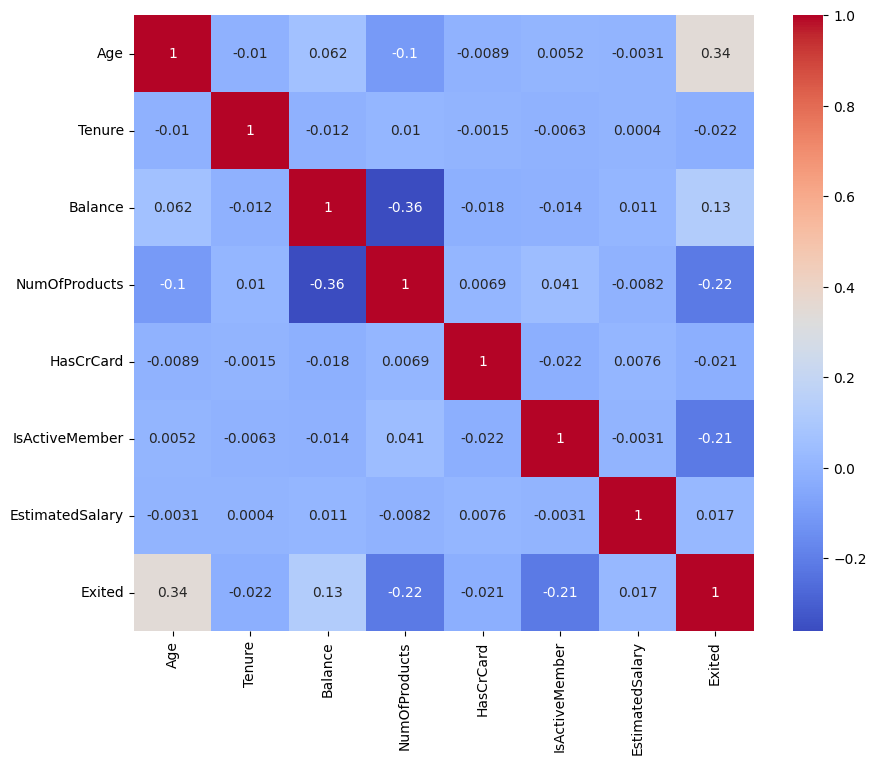

In [24]:
# correlation
corr = train_new.select_dtypes('number').corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr,annot=True, cmap="coolwarm")

In [25]:
# chi2 test for cat column
temp_df = train_new.copy()
encode = LabelEncoder()
crosstab = pd.crosstab(temp_df['Geography'],temp_df['Exited'])
chi2,p,dof,expected = chi2_contingency(crosstab)
print(p)

0.0


In [26]:
encode = LabelEncoder()
crosstab = pd.crosstab(temp_df['Gender'],temp_df['Exited'])
chi2,p,dof,expected = chi2_contingency(crosstab)
print(p)

0.0


# Encoding

In [27]:
train_new['Gender'] = encode.fit_transform(train_new['Gender'])

In [28]:
category = [['Low','Medium','High']]
ord_encode = OrdinalEncoder(categories=category)
train_new['creditscorecat'] = ord_encode.fit_transform(train_new[['creditscorecat']])

In [29]:
train_new = pd.get_dummies(train_new, columns=['Geography'], drop_first=True)

# RFE

In [30]:
model = LogisticRegression(max_iter=1000)
rfe = RFE(model,n_features_to_select=7)
rfe = rfe.fit(train_new.drop(columns=['Exited']),train_new['Exited'])
imp_feature = train_new.drop(columns=['Exited']).columns[rfe.support_]
print("important Features: ", imp_feature)

important Features:  Index(['Gender', 'Age', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'creditscorecat', 'Geography_Germany'],
      dtype='object')


# random forest

In [31]:
r_forest = RandomForestClassifier(n_estimators=100)
r_forest.fit(train_new.drop(columns=['Exited']),train_new['Exited'])
# important = r_forest.feature_importances_
df = pd.DataFrame({'columns': train_new.drop(columns=['Exited']).columns,'importance':r_forest.feature_importances_})
# print(important)
df

,columns,importance
0,Gender,0.019733
1,Age,0.253632
2,Tenure,0.092772
3,Balance,0.135419
4,NumOfProducts,0.143956
5,HasCrCard,0.014359
6,IsActiveMember,0.046882
7,EstimatedSalary,0.225758
8,creditscorecat,0.027781
9,Geography_Germany,0.029608


In [32]:
df.sort_values('importance',ascending=False)

,columns,importance
1,Age,0.253632
7,EstimatedSalary,0.225758
4,NumOfProducts,0.143956
3,Balance,0.135419
2,Tenure,0.092772
6,IsActiveMember,0.046882
9,Geography_Germany,0.029608
8,creditscorecat,0.027781
0,Gender,0.019733
5,HasCrCard,0.014359


## summary of feature selection
- from corelation ...age is important(0.34)
- both categorical feature is important
- rfe said (['Gender', 'Age', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'creditscorecat', 'Geography_Germany'] these are important feature
- according to random forest age,estimated salary,num of product, balance are top 4 features
- so we can proceed for now with (age,NumOfProducts,Gender,Geography,EstimatedSalary,Balance,creditscorecat,IsActiveMember)

In [33]:
train_new.head()

,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,creditscorecat,Geography_Germany,Geography_Spain
id,,,,,,,,,,,,
1,1,33.0,1,0.00,2,1.0,1.0,49503.50,0,1.0,False,False
2,1,40.0,10,0.00,2,1.0,0.0,184866.69,0,1.0,False,False
5,1,36.0,4,131778.58,1,1.0,0.0,136024.31,1,0.0,True,False
6,0,30.0,8,144772.69,1,1.0,0.0,29792.11,0,0.0,False,False
7,1,37.0,1,138476.41,1,1.0,0.0,106851.60,0,1.0,False,True


# Model building (Random Forest)

In [34]:
X = train_new[['Age','NumOfProducts','Gender','Geography_Germany','Geography_Spain','EstimatedSalary','Balance','creditscorecat','IsActiveMember']]
y = train_new['Exited']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [48]:
# model = RandomForestClassifier(n_estimators=100, random_state=42)
model = RandomForestClassifier(n_estimators= 200, min_samples_split=2, max_depth= 10, random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, n_estimators=200, random_state=42)

In [49]:
y_pred_prob = model.predict_proba(X_test)[:, 1]

In [50]:
auc_roc = roc_auc_score(y_test, y_pred_prob)
print(f"AUC-ROC Score: {auc_roc}")

AUC-ROC Score: 0.8945824426418723


# tunning

In [38]:
# from sklearn.model_selection import RandomizedSearchCV
# from sklearn.ensemble import RandomForestClassifier
# param_grid = {
#     'n_estimators': [200, 250],
#     'max_depth': [None, 10, 20, 30],
#     'min_samples_split': [2, 5, 10]
# }

# rf = RandomForestClassifier(random_state=42)
# random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_grid, n_iter=50,  cv=5,  n_jobs=-1,  scoring='roc_auc', random_state=42)

# random_search.fit(X_train, y_train)
# print(random_search.best_params_)



{'n_estimators': 200, 'min_samples_split': 2, 'max_depth': 10}


In [ ]:
# you can see above model..after tunning model performance has increased..before(0.86) after(0.89)

# final predictions for Kaggle compitition

In [69]:
train_final = pd.read_csv('train_bank.csv')
test_final  = pd.read_csv('test_bank.csv')

In [70]:
train_final.drop(columns=['id','CustomerId','Surname'],inplace=True)

In [71]:
bins = [300, 600, 750, 850]
labels = ['Low', 'Medium', 'High']
train_final['creditscorecat'] = pd.cut(train_final['CreditScore'],bins=bins, labels=labels)

In [72]:
train_final['Gender'] = encode.fit_transform(train_final['Gender'])

In [73]:
category = [['Low','Medium','High']]
ord_encode = OrdinalEncoder(categories=category)
train_final['creditscorecat'] = ord_encode.fit_transform(train_final[['creditscorecat']])

In [74]:
train_final = pd.get_dummies(train_final, columns=['Geography'], drop_first=True)

In [75]:
train_final = train_final[['Age','NumOfProducts','Gender','Geography_Germany','Geography_Spain','EstimatedSalary','Balance','creditscorecat','IsActiveMember','Exited']]
train_final.head()

,Age,NumOfProducts,Gender,Geography_Germany,Geography_Spain,EstimatedSalary,Balance,creditscorecat,IsActiveMember,Exited
0,33.0,2,1,False,False,181449.97,0.00,1.0,0.0,0
1,33.0,2,1,False,False,49503.50,0.00,1.0,1.0,0
2,40.0,2,1,False,False,184866.69,0.00,1.0,0.0,0
3,34.0,1,1,False,False,84560.88,148882.54,0.0,1.0,0
4,33.0,2,1,False,True,15068.83,0.00,1.0,1.0,0


# applying same steps on test_final

In [76]:
test_final.drop(columns=['CustomerId','Surname'],inplace=True)

In [77]:
bins = [300, 600, 750, 850]
labels = ['Low', 'Medium', 'High']
test_final['creditscorecat'] = pd.cut(test_final['CreditScore'],bins=bins, labels=labels)

In [78]:
test_final['Gender'] = encode.fit_transform(test_final['Gender'])

In [79]:
category = [['Low','Medium','High']]
ord_encode = OrdinalEncoder(categories=category)
test_final['creditscorecat'] = ord_encode.fit_transform(test_final[['creditscorecat']])

In [80]:
test_final = pd.get_dummies(test_final, columns=['Geography'], drop_first=True)

In [81]:
test_final.head()

,id,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,creditscorecat,Geography_Germany,Geography_Spain
0,165034,586,0,23.0,2,0.00,2,0.0,1.0,160976.75,0.0,False,False
1,165035,683,0,46.0,2,0.00,1,1.0,0.0,72549.27,1.0,False,False
2,165036,656,0,34.0,7,0.00,2,1.0,0.0,138882.09,1.0,False,False
3,165037,681,1,36.0,8,0.00,1,1.0,0.0,113931.57,1.0,False,False
4,165038,752,1,38.0,10,121263.62,1,1.0,0.0,139431.00,2.0,True,False


In [82]:
test_final = test_final[['id','Age','NumOfProducts','Gender','Geography_Germany','Geography_Spain','EstimatedSalary','Balance','creditscorecat','IsActiveMember']]

# predictions

In [84]:
X_train = train_final.drop(columns=['Exited'])
y_train = train_final['Exited']

X_test = test_final.drop(columns=['id'])

model = RandomForestClassifier(n_estimators= 200, min_samples_split=2, max_depth= 10, random_state=42)
model.fit(X_train, y_train)

y_test_proba = model.predict_proba(X_test)[:, 1]
submission_df = pd.DataFrame({'id': test_final['id'], 'Exited': y_test_proba})

In [85]:
submission_df.to_csv('submission_bank.csv', index=False)